Downloaded seurat object, transfer from rdm to scratch

``` bash
rsync -azvhp /QRISdata/Q5935/nikita/scdata/PRJCA005422/ /scratch/user/s4436039/scdata/PRJCA005422 
```

##### Steps for reading in dataset (following download), initial QC, dim reduction/clustering and saving out the myeloid cluster for **PRJCA005422**

file downloaded:
raw_object.rds

In [2]:
#set wd
getwd()
setwd('/scratch/user/s4436039/scdata/PRJCA005422')
getwd()

[1] "/scratch/user/s4436039/Nikita-project"

[1] "/scratch/user/s4436039/scdata/PRJCA005422"

In [3]:
#Load packages
library(dplyr)
library(Seurat)
library(patchwork)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [4]:
#Load in downloaded RDS
OC <- readRDS("/scratch/user/s4436039/scdata/PRJCA005422/raw_object.rds")

In [5]:
#checking OC is already a seurat object
class(OC)

[1] "Seurat"
attr(,"package")
[1] "Seurat"

In [6]:
head(OC@meta.data) 
tail(OC@meta.data) 

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,S.Score,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>
EOC1_PBMC_cell_AAACCTGAGAAGGCCT,EOC1,6737,1661,EOC1_PBMC_cell_AAACCTGAGAAGGCCT,HGSOC1_BC,PBMC,HGSOC1,2.953837,47.36530,0.3265548,0.00206277,-0.07325614,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-6.403656,6.157662
EOC1_PBMC_cell_AAACCTGAGATGCGAC,EOC1,33892,4374,EOC1_PBMC_cell_AAACCTGAGATGCGAC,HGSOC1_BC,PBMC,HGSOC1,4.900862,22.13502,0.5783076,-0.03958396,-0.08887451,B03_PlasmaB-SDC1,BC,B,Lymphoid cells,1.918203,13.411985
EOC1_PBMC_cell_AAACCTGAGCTGTTCA,EOC1,4999,1636,EOC1_PBMC_cell_AAACCTGAGCTGTTCA,HGSOC1_BC,PBMC,HGSOC1,3.580716,37.60752,0.2800560,0.00392598,-0.12380690,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.025195,5.683392
EOC1_PBMC_cell_AAACCTGAGGGTCTCC,EOC1,6399,1627,EOC1_PBMC_cell_AAACCTGAGGGTCTCC,HGSOC1_BC,PBMC,HGSOC1,2.453508,46.36662,0.3438037,-0.05858825,-0.09282529,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.745404,5.792777
EOC1_PBMC_cell_AAACCTGAGGTGCTAG,EOC1,3766,1269,EOC1_PBMC_cell_AAACCTGAGGTGCTAG,HGSOC1_BC,PBMC,HGSOC1,6.027616,36.37812,0.4248540,0.01469597,-0.06016309,B02_FollicularB-MS4A1,BC,B,Lymphoid cells,-6.601071,12.586838
EOC1_PBMC_cell_AAACCTGCAAAGGCGT,EOC1,3916,1173,EOC1_PBMC_cell_AAACCTGCAAAGGCGT,HGSOC1_BC,PBMC,HGSOC1,2.860061,46.27171,0.2553626,-0.06918704,-0.07071317,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.874930,5.854532


,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,S.Score,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>
C1_OC_cell_TGAAAGATCTGTTGAG,C1,11492,3467,C1_OC_cell_TGAAAGATCTGTTGAG,C1_PT,Primary Tumor,C1,4.716324,11.90393,0.5308040,-0.024740290,-0.009191254,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.160834,13.40850
C1_OC_cell_TGCTACCGTCCGAACC,C1,20797,4986,C1_OC_cell_TGCTACCGTCCGAACC,C1_PT,Primary Tumor,C1,6.736549,14.33861,0.9424436,-0.074286100,-0.077468690,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.011838,13.73860
C1_OC_cell_TGGGCGTTCACTATTC,C1,24397,5799,C1_OC_cell_TGGGCGTTCACTATTC,C1_PT,Primary Tumor,C1,3.939009,12.40316,1.6723370,0.247324900,0.465105500,E06_ENDO-MKI67,PT,Proliferative cells,Proliferative cells,5.372723,12.89852
C1_OC_cell_TGTCCCAGTAACGACG,C1,3355,1584,C1_OC_cell_TGTCCCAGTAACGACG,C1_PT,Primary Tumor,C1,3.964232,15.29061,1.2220570,-0.005340521,0.006410820,E05_ENDO-KIT,PT,Endothelial cells,Endothelial cells,5.991465,13.53124
C1_OC_cell_TGTTCCGCAGGTCTCG,C1,6057,2142,C1_OC_cell_TGTTCCGCAGGTCTCG,C1_PT,Primary Tumor,C1,8.915305,17.76457,0.8915305,0.006440935,-0.030069060,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.800605,12.96732
C1_OC_cell_TTCTCAATCACCTTAT,C1,10312,3497,C1_OC_cell_TTCTCAATCACCTTAT,C1_PT,Primary Tumor,C1,4.325058,13.07215,1.0085340,-0.025662310,-0.029561440,E05_ENDO-KIT,PT,Endothelial cells,Endothelial cells,5.916722,13.69530


In [7]:
#below code gives error: Error in slot(object = object, name = s): no slot of name "images" for this object of class "Seurat"
#using workarounds here as seen here: https://github.com/satijalab/seurat/issues/7691

OC@images <- list()
OC@assays$RNA <- CreateAssay5Object(OC@assays$RNA@counts)

In [8]:
OC.updated = UpdateSeuratObject(object = OC)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure



Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Updating slots in RNA

Validating object structure for Assay5 ‘RNA’

Object representation is consistent with the most current Seurat version



In [9]:
head(OC.updated)

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,S.Score,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>
EOC1_PBMC_cell_AAACCTGAGAAGGCCT,EOC1,6736,1660,EOC1_PBMC_cell_AAACCTGAGAAGGCCT,HGSOC1_BC,PBMC,HGSOC1,2.953837,47.36530,0.3265548,0.00206277,-0.07325614,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-6.403656,6.15766247
EOC1_PBMC_cell_AAACCTGAGATGCGAC,EOC1,33886,4372,EOC1_PBMC_cell_AAACCTGAGATGCGAC,HGSOC1_BC,PBMC,HGSOC1,4.900862,22.13502,0.5783076,-0.03958396,-0.08887451,B03_PlasmaB-SDC1,BC,B,Lymphoid cells,1.918203,13.41198453
EOC1_PBMC_cell_AAACCTGAGCTGTTCA,EOC1,4998,1635,EOC1_PBMC_cell_AAACCTGAGCTGTTCA,HGSOC1_BC,PBMC,HGSOC1,3.580716,37.60752,0.2800560,0.00392598,-0.12380690,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.025195,5.68339165
EOC1_PBMC_cell_AAACCTGAGGGTCTCC,EOC1,6397,1625,EOC1_PBMC_cell_AAACCTGAGGGTCTCC,HGSOC1_BC,PBMC,HGSOC1,2.453508,46.36662,0.3438037,-0.05858825,-0.09282529,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.745404,5.79277714
EOC1_PBMC_cell_AAACCTGAGGTGCTAG,EOC1,3766,1269,EOC1_PBMC_cell_AAACCTGAGGTGCTAG,HGSOC1_BC,PBMC,HGSOC1,6.027616,36.37812,0.4248540,0.01469597,-0.06016309,B02_FollicularB-MS4A1,BC,B,Lymphoid cells,-6.601071,12.58683785
EOC1_PBMC_cell_AAACCTGCAAAGGCGT,EOC1,3916,1173,EOC1_PBMC_cell_AAACCTGCAAAGGCGT,HGSOC1_BC,PBMC,HGSOC1,2.860061,46.27171,0.2553626,-0.06918704,-0.07071317,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.874930,5.85453185
EOC1_PBMC_cell_AAACCTGCACATTAGC,EOC1,2297,1032,EOC1_PBMC_cell_AAACCTGCACATTAGC,HGSOC1_BC,PBMC,HGSOC1,6.051371,28.29778,0.3047453,-0.02445791,-0.03207259,T09_CD8-CX3CR1,BC,CD8+ T,Lymphoid cells,-2.624247,0.03911694
EOC1_PBMC_cell_AAACCTGCACCAGCAC,EOC1,7251,2142,EOC1_PBMC_cell_AAACCTGCACCAGCAC,HGSOC1_BC,PBMC,HGSOC1,4.935889,36.74342,0.1378740,-0.04448776,-0.06574359,T09_CD8-CX3CR1,BC,CD8+ T,Lymphoid cells,-1.631330,0.59362324
EOC1_PBMC_cell_AAACCTGCAGTGGGAT,EOC1,4476,1553,EOC1_PBMC_cell_AAACCTGCAGTGGGAT,HGSOC1_BC,PBMC,HGSOC1,6.568365,34.87489,0.2680965,-0.05592684,-0.12768282,T02_CD4-ANXA1,BC,CD4+ T,Lymphoid cells,-5.082292,5.15236195


In [10]:
#Add dataset code in front of all cells
colnames(OC.updated) <- paste0("PRJCA005422_", colnames(OC.updated))

In [11]:
OC.updated
head(OC.updated@meta.data)
tail(OC.updated@meta.data)

An object of class Seurat 
27127 features across 223363 samples within 1 assay 
Active assay: RNA (27127 features, 0 variable features)
 1 layer present: counts

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,S.Score,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGAAGGCCT,EOC1,6736,1660,EOC1_PBMC_cell_AAACCTGAGAAGGCCT,HGSOC1_BC,PBMC,HGSOC1,2.953837,47.36530,0.3265548,0.00206277,-0.07325614,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-6.403656,6.157662
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGATGCGAC,EOC1,33886,4372,EOC1_PBMC_cell_AAACCTGAGATGCGAC,HGSOC1_BC,PBMC,HGSOC1,4.900862,22.13502,0.5783076,-0.03958396,-0.08887451,B03_PlasmaB-SDC1,BC,B,Lymphoid cells,1.918203,13.411985
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGCTGTTCA,EOC1,4998,1635,EOC1_PBMC_cell_AAACCTGAGCTGTTCA,HGSOC1_BC,PBMC,HGSOC1,3.580716,37.60752,0.2800560,0.00392598,-0.12380690,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.025195,5.683392
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGGGTCTCC,EOC1,6397,1625,EOC1_PBMC_cell_AAACCTGAGGGTCTCC,HGSOC1_BC,PBMC,HGSOC1,2.453508,46.36662,0.3438037,-0.05858825,-0.09282529,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.745404,5.792777
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGGTGCTAG,EOC1,3766,1269,EOC1_PBMC_cell_AAACCTGAGGTGCTAG,HGSOC1_BC,PBMC,HGSOC1,6.027616,36.37812,0.4248540,0.01469597,-0.06016309,B02_FollicularB-MS4A1,BC,B,Lymphoid cells,-6.601071,12.586838
PRJCA005422_EOC1_PBMC_cell_AAACCTGCAAAGGCGT,EOC1,3916,1173,EOC1_PBMC_cell_AAACCTGCAAAGGCGT,HGSOC1_BC,PBMC,HGSOC1,2.860061,46.27171,0.2553626,-0.06918704,-0.07071317,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.874930,5.854532


,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,S.Score,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>
PRJCA005422_C1_OC_cell_TGAAAGATCTGTTGAG,C1,11490,3466,C1_OC_cell_TGAAAGATCTGTTGAG,C1_PT,Primary Tumor,C1,4.716324,11.90393,0.5308040,-0.024740290,-0.009191254,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.160834,13.40850
PRJCA005422_C1_OC_cell_TGCTACCGTCCGAACC,C1,20793,4985,C1_OC_cell_TGCTACCGTCCGAACC,C1_PT,Primary Tumor,C1,6.736549,14.33861,0.9424436,-0.074286100,-0.077468690,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.011838,13.73860
PRJCA005422_C1_OC_cell_TGGGCGTTCACTATTC,C1,24396,5798,C1_OC_cell_TGGGCGTTCACTATTC,C1_PT,Primary Tumor,C1,3.939009,12.40316,1.6723370,0.247324900,0.465105500,E06_ENDO-MKI67,PT,Proliferative cells,Proliferative cells,5.372723,12.89852
PRJCA005422_C1_OC_cell_TGTCCCAGTAACGACG,C1,3354,1583,C1_OC_cell_TGTCCCAGTAACGACG,C1_PT,Primary Tumor,C1,3.964232,15.29061,1.2220570,-0.005340521,0.006410820,E05_ENDO-KIT,PT,Endothelial cells,Endothelial cells,5.991465,13.53124
PRJCA005422_C1_OC_cell_TGTTCCGCAGGTCTCG,C1,6056,2141,C1_OC_cell_TGTTCCGCAGGTCTCG,C1_PT,Primary Tumor,C1,8.915305,17.76457,0.8915305,0.006440935,-0.030069060,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.800605,12.96732
PRJCA005422_C1_OC_cell_TTCTCAATCACCTTAT,C1,10310,3496,C1_OC_cell_TTCTCAATCACCTTAT,C1_PT,Primary Tumor,C1,4.325058,13.07215,1.0085340,-0.025662310,-0.029561440,E05_ENDO-KIT,PT,Endothelial cells,Endothelial cells,5.916722,13.69530


#### Need to remove non HGSOC patients: 
* UOC1
* ECO1
* C1

#### Will also then seperate tumour (keep primary and mets together) from ascites and analyse seperate (not analysing PBMC or LNs at the moment)
* Seperating ascites from tumour was done as originally kept together and saw they mapped quite differently on UMAP (see 2024-05-01_PRJCA005422)

In [12]:
table(Idents(OC.updated))


   C1  ECO1  EOC1 EOC10  EOC2  EOC3  EOC4  EOC5  EOC6  EOC7  EOC8  EOC9 OCCC1 
 3735 52581 28096  5856 37813 28058 15346  6943 20176  2968  6631  7795  3743 
 UOC1 
 3622 

In [13]:
#subsetting out unwanted patients (non-HGSOC)
HGSOC <- subset(x = OC.updated, subset = orig.ident != "C1")
HGSOC <- subset(x = HGSOC, subset = orig.ident != "UOC1")
HGSOC <- subset(x = HGSOC, subset = orig.ident != "OCCC1")
HGSOC <- subset(x = HGSOC, subset = orig.ident != "ECO1")

In [14]:
HGSOC
head(HGSOC@meta.data)
tail(HGSOC@meta.data)

An object of class Seurat 
27127 features across 159682 samples within 1 assay 
Active assay: RNA (27127 features, 0 variable features)
 1 layer present: counts

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,S.Score,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGAAGGCCT,EOC1,6736,1660,EOC1_PBMC_cell_AAACCTGAGAAGGCCT,HGSOC1_BC,PBMC,HGSOC1,2.953837,47.36530,0.3265548,0.00206277,-0.07325614,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-6.403656,6.157662
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGATGCGAC,EOC1,33886,4372,EOC1_PBMC_cell_AAACCTGAGATGCGAC,HGSOC1_BC,PBMC,HGSOC1,4.900862,22.13502,0.5783076,-0.03958396,-0.08887451,B03_PlasmaB-SDC1,BC,B,Lymphoid cells,1.918203,13.411985
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGCTGTTCA,EOC1,4998,1635,EOC1_PBMC_cell_AAACCTGAGCTGTTCA,HGSOC1_BC,PBMC,HGSOC1,3.580716,37.60752,0.2800560,0.00392598,-0.12380690,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.025195,5.683392
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGGGTCTCC,EOC1,6397,1625,EOC1_PBMC_cell_AAACCTGAGGGTCTCC,HGSOC1_BC,PBMC,HGSOC1,2.453508,46.36662,0.3438037,-0.05858825,-0.09282529,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.745404,5.792777
PRJCA005422_EOC1_PBMC_cell_AAACCTGAGGTGCTAG,EOC1,3766,1269,EOC1_PBMC_cell_AAACCTGAGGTGCTAG,HGSOC1_BC,PBMC,HGSOC1,6.027616,36.37812,0.4248540,0.01469597,-0.06016309,B02_FollicularB-MS4A1,BC,B,Lymphoid cells,-6.601071,12.586838
PRJCA005422_EOC1_PBMC_cell_AAACCTGCAAAGGCGT,EOC1,3916,1173,EOC1_PBMC_cell_AAACCTGCAAAGGCGT,HGSOC1_BC,PBMC,HGSOC1,2.860061,46.27171,0.2553626,-0.06918704,-0.07071317,T01_CD4-CCR7,BC,CD4+ T,Lymphoid cells,-5.874930,5.854532


,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,S.Score,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>
PRJCA005422_EOC10_OC_cell_TCTTTCCCAAGGACTG,EOC10,3328,1608,EOC10_OC_cell_TCTTTCCCAAGGACTG,HGSOC10_PT,Primary Tumor,HGSOC10,4.926404,10.84410,1.2916790,0.018276250,-0.04386271,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.389700,13.13395
PRJCA005422_EOC10_OC_cell_TCTTTCCGTCCAACTA,EOC10,4734,2112,EOC10_OC_cell_TCTTTCCGTCCAACTA,HGSOC10_PT,Primary Tumor,HGSOC10,6.462513,11.59451,1.0982050,0.037545280,-0.02619559,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.857343,13.69272
PRJCA005422_EOC10_OC_cell_TGATTTCAGGTGCAAC,EOC10,6285,2352,EOC10_OC_cell_TGATTTCAGGTGCAAC,HGSOC10_PT,Primary Tumor,HGSOC10,4.119612,23.76332,0.7475744,-0.007610412,-0.08027389,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.803862,13.20346
PRJCA005422_EOC10_OC_cell_TGCGTGGCACTAAGTC,EOC10,3639,1663,EOC10_OC_cell_TGCGTGGCACTAAGTC,HGSOC10_PT,Primary Tumor,HGSOC10,4.616653,19.23605,0.3022808,-0.034598050,-0.10051180,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.381480,13.45934
PRJCA005422_EOC10_OC_cell_TGCGTGGCATACCATG,EOC10,5888,2188,EOC10_OC_cell_TGCGTGGCATACCATG,HGSOC10_PT,Primary Tumor,HGSOC10,1.935813,25.92970,2.0716590,0.012294940,-0.06054989,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.056010,12.87180
PRJCA005422_EOC10_OC_cell_TTATGCTCAATAACGA,EOC10,1908,1120,EOC10_OC_cell_TTATGCTCAATAACGA,HGSOC10_PT,Primary Tumor,HGSOC10,9.119497,10.63941,1.0482180,0.002544156,-0.08221963,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.838602,13.78173


In [15]:
table(Idents(HGSOC))


 EOC1 EOC10  EOC2  EOC3  EOC4  EOC5  EOC6  EOC7  EOC8  EOC9 
28096  5856 37813 28058 15346  6943 20176  2968  6631  7795 

In [16]:
table(HGSOC$Groups)


   Primary Tumor Metastatic Tumor       Lymph Node          Ascites 
           45146            21561            26449            38206 
            PBMC 
           28320 

In [17]:
#subsetting out unwanted tissues and seperating tumour from ascites
HGSOC_ascites <- subset(x = HGSOC, subset = Groups == "Ascites")
HGSOC_tumour <- subset(x = HGSOC, subset = Groups == "Primary Tumor" | Groups == "Metastatic Tumor")

In [18]:
table(HGSOC$Groups)
table(HGSOC_ascites$Groups)
table(HGSOC_tumour$Groups)


   Primary Tumor Metastatic Tumor       Lymph Node          Ascites 
           45146            21561            26449            38206 
            PBMC 
           28320 


   Primary Tumor Metastatic Tumor       Lymph Node          Ascites 
               0                0                0            38206 
            PBMC 
               0 


   Primary Tumor Metastatic Tumor       Lymph Node          Ascites 
           45146            21561                0                0 
            PBMC 
               0 

In [19]:
HGSOC
HGSOC_ascites
HGSOC_tumour

An object of class Seurat 
27127 features across 159682 samples within 1 assay 
Active assay: RNA (27127 features, 0 variable features)
 1 layer present: counts

An object of class Seurat 
27127 features across 38206 samples within 1 assay 
Active assay: RNA (27127 features, 0 variable features)
 1 layer present: counts

An object of class Seurat 
27127 features across 66707 samples within 1 assay 
Active assay: RNA (27127 features, 0 variable features)
 1 layer present: counts

In [20]:
table(HGSOC_tumour$Patients)
table(HGSOC_ascites$Patients)


 HGSOC1  HGSOC2  HGSOC3  HGSOC4  HGSOC5  HGSOC6  HGSOC7  HGSOC8  HGSOC9 HGSOC10 
  13763    8919   10807    8209    3396    8991    2968    3048    3100    3506 
   ECO1    UOC1   OCCC1      C1 
      0       0       0       0 


 HGSOC1  HGSOC2  HGSOC3  HGSOC4  HGSOC5  HGSOC6  HGSOC7  HGSOC8  HGSOC9 HGSOC10 
   6080    9204    4951       0    3547    3796       0    3583    4695    2350 
   ECO1    UOC1   OCCC1      C1 
      0       0       0       0 

In [20]:
table(HGSOC_tumour$Samples)
table(HGSOC_ascites$Samples)


 HGSOC1_MT  HGSOC1_PT HGSOC10_PT  HGSOC2_PT  HGSOC3_MT  HGSOC3_PT  HGSOC4_MT 
      7943       5820       3506       8919       5215       5592       2905 
 HGSOC4_PT  HGSOC5_PT  HGSOC6_MT  HGSOC6_PT  HGSOC7_PT  HGSOC8_PT  HGSOC9_PT 
      5304       3396       5498       3493       2968       3048       3100 


 HGSOC1_AS HGSOC10_AS  HGSOC2_AS  HGSOC3_AS  HGSOC5_AS  HGSOC6_AS  HGSOC8_AS 
      6080       2350       9204       4951       3547       3796       3583 
 HGSOC9_AS 
      4695 

In [21]:
#set metadata
#HGSOC_ascites
HGSOC_ascites@meta.data$sample_type <- HGSOC_ascites@meta.data$Groups
HGSOC_ascites@meta.data$cancer_type <- "HGSOC"
HGSOC_ascites@meta.data$patient_id <- HGSOC_ascites@meta.data$Patients
HGSOC_ascites@meta.data$sample_id <- paste0("PRJCA005422_", HGSOC_ascites@meta.data$Samples)

In [23]:
head(HGSOC_ascites@meta.data)
tail(HGSOC_ascites@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,⋯,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>
PRJCA005422_EOC1_FS_cell_AAACCTGAGATCCCGC,EOC1,10454,2694,EOC1_FS_cell_AAACCTGAGATCCCGC,HGSOC1_AS,Ascites,HGSOC1,4.161087,35.24010,0.2678401,⋯,T10_CD8-HAVCR2,AS,CD8+ T,Lymphoid cells,-4.01762578,1.6216145,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS
PRJCA005422_EOC1_FS_cell_AAACCTGAGCGATCCC,EOC1,3165,1251,EOC1_FS_cell_AAACCTGAGCGATCCC,HGSOC1_AS,Ascites,HGSOC1,4.516740,31.08023,0.6001263,⋯,T08_CD8-GZMK,AS,CD8+ T,Lymphoid cells,-4.58068654,3.0822748,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS
PRJCA005422_EOC1_FS_cell_AAACCTGAGGATGTAT,EOC1,3229,1169,EOC1_FS_cell_AAACCTGAGGATGTAT,HGSOC1_AS,Ascites,HGSOC1,6.782286,33.47786,0.2167854,⋯,B01_NaiveB-CD72,AS,B,Lymphoid cells,-7.13849637,12.1479865,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS
PRJCA005422_EOC1_FS_cell_AAACCTGAGTGGAGAA,EOC1,5372,1698,EOC1_FS_cell_AAACCTGAGTGGAGAA,HGSOC1_AS,Ascites,HGSOC1,3.611318,36.95086,0.4839911,⋯,T02_CD4-ANXA1,AS,CD4+ T,Lymphoid cells,-5.04447552,5.0159007,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS
PRJCA005422_EOC1_FS_cell_AAACCTGCAACGCACC,EOC1,5148,1913,EOC1_FS_cell_AAACCTGCAACGCACC,HGSOC1_AS,Ascites,HGSOC1,2.933178,24.43667,0.3302253,⋯,T03_CD4-FOXP3,AS,CD4+ T,Lymphoid cells,-1.11060306,4.6272436,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS
PRJCA005422_EOC1_FS_cell_AAACCTGCATTACCTT,EOC1,3041,1476,EOC1_FS_cell_AAACCTGCATTACCTT,HGSOC1_AS,Ascites,HGSOC1,6.215061,16.96810,0.3288392,⋯,N01_NK-XCL1,AS,NK,Lymphoid cells,0.08312429,0.1599053,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS


,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,⋯,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>
PRJCA005422_EOC10_FS_cell_TGCGTGGAGCTGTCTA,EOC10,19704,3857,EOC10_FS_cell_TGCGTGGAGCTGTCTA,HGSOC10_AS,Ascites,HGSOC10,6.348642,28.089317,0.2791170,⋯,S11_MC-DES,AS,Mesothelial cells,Stromal cells,9.136018,-11.97948,Ascites,HGSOC,HGSOC10,PRJCA005422_HGSOC10_AS
PRJCA005422_EOC10_FS_cell_TGCTGCTGTACATCCA,EOC10,704,555,EOC10_FS_cell_TGCTGCTGTACATCCA,HGSOC10_AS,Ascites,HGSOC10,0.000000,3.551136,0.4261364,⋯,S11_MC-DES,AS,Mesothelial cells,Stromal cells,9.137219,-11.95671,Ascites,HGSOC,HGSOC10,PRJCA005422_HGSOC10_AS
PRJCA005422_EOC10_FS_cell_TGTATTCTCTCTAAGG,EOC10,22348,4761,EOC10_FS_cell_TGTATTCTCTCTAAGG,HGSOC10_AS,Ascites,HGSOC10,9.705566,22.140684,0.4340433,⋯,S11_MC-DES,AS,Mesothelial cells,Stromal cells,9.179139,-11.99492,Ascites,HGSOC,HGSOC10,PRJCA005422_HGSOC10_AS
PRJCA005422_EOC10_FS_cell_TTCTCAATCCAAACTG,EOC10,28431,5457,EOC10_FS_cell_TTCTCAATCCAAACTG,HGSOC10_AS,Ascites,HGSOC10,4.318773,17.348948,0.7561370,⋯,S11_MC-DES,AS,Mesothelial cells,Stromal cells,9.201993,-12.11404,Ascites,HGSOC,HGSOC10,PRJCA005422_HGSOC10_AS
PRJCA005422_EOC10_FS_cell_TTTGCGCAGTGTCCAT,EOC10,19966,4265,EOC10_FS_cell_TTTGCGCAGTGTCCAT,HGSOC10_AS,Ascites,HGSOC10,3.976760,26.880697,0.5359110,⋯,S11_MC-DES,AS,Mesothelial cells,Stromal cells,9.153317,-11.79728,Ascites,HGSOC,HGSOC10,PRJCA005422_HGSOC10_AS
PRJCA005422_EOC10_FS_cell_TTTGGTTTCCGCAGTG,EOC10,10275,2825,EOC10_FS_cell_TTTGGTTTCCGCAGTG,HGSOC10_AS,Ascites,HGSOC10,5.459854,23.941606,0.4574209,⋯,S11_MC-DES,AS,Mesothelial cells,Stromal cells,9.108284,-11.89072,Ascites,HGSOC,HGSOC10,PRJCA005422_HGSOC10_AS


In [24]:
#HGSOC_tumour
HGSOC_tumour@meta.data$sample_type <- HGSOC_tumour@meta.data$Groups
HGSOC_tumour@meta.data$cancer_type <- "HGSOC"
HGSOC_tumour@meta.data$patient_id <- HGSOC_tumour@meta.data$Patients
HGSOC_tumour@meta.data$sample_id <- paste0("PRJCA005422_", HGSOC_tumour@meta.data$Samples)

In [26]:
head(HGSOC_tumour@meta.data)
tail(HGSOC_tumour@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,⋯,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>
PRJCA005422_EOC1_OC_cell_AAACCTGAGATGCGAC,EOC1,567,286,EOC1_OC_cell_AAACCTGAGATGCGAC,HGSOC1_PT,Primary Tumor,HGSOC1,7.2310406,20.105820,0.7054674,⋯,Proliferative cells,PT,Proliferative cells,Proliferative cells,-4.50855920,6.7797562,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT
PRJCA005422_EOC1_OC_cell_AAACCTGCAGCTGCAC,EOC1,30187,1427,EOC1_OC_cell_AAACCTGCAGCTGCAC,HGSOC1_PT,Primary Tumor,HGSOC1,0.5631563,2.166496,0.1026932,⋯,B03_PlasmaB-SDC1,PT,B,Lymphoid cells,-0.62123874,12.6910764,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT
PRJCA005422_EOC1_OC_cell_AAACCTGGTGATAAAC,EOC1,9983,3032,EOC1_OC_cell_AAACCTGGTGATAAAC,HGSOC1_PT,Primary Tumor,HGSOC1,4.1662494,23.024537,0.3805709,⋯,Proliferative cells,PT,Proliferative cells,Proliferative cells,1.22135309,2.6347593,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT
PRJCA005422_EOC1_OC_cell_AAAGATGAGCTAAACA,EOC1,4431,1810,EOC1_OC_cell_AAAGATGAGCTAAACA,HGSOC1_PT,Primary Tumor,HGSOC1,2.7075812,15.907040,0.9702166,⋯,T03_CD4-FOXP3,PT,CD4+ T,Lymphoid cells,0.01758646,4.1884056,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT
PRJCA005422_EOC1_OC_cell_AAAGTAGAGCGTCTAT,EOC1,1010,634,EOC1_OC_cell_AAAGTAGAGCGTCTAT,HGSOC1_PT,Primary Tumor,HGSOC1,3.9564787,12.957468,0.3956479,⋯,T08_CD8-GZMK,PT,CD8+ T,Lymphoid cells,-4.61451527,2.3624628,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT
PRJCA005422_EOC1_OC_cell_AAAGTAGAGGCATGGT,EOC1,3198,1313,EOC1_OC_cell_AAAGTAGAGGCATGGT,HGSOC1_PT,Primary Tumor,HGSOC1,2.0637899,18.667917,0.3752345,⋯,T08_CD8-GZMK,PT,CD8+ T,Lymphoid cells,-3.89796826,-0.1594356,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT


,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,⋯,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>
PRJCA005422_EOC10_OC_cell_TCTTTCCCAAGGACTG,EOC10,3328,1608,EOC10_OC_cell_TCTTTCCCAAGGACTG,HGSOC10_PT,Primary Tumor,HGSOC10,4.926404,10.84410,1.2916790,⋯,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.389700,13.13395,Primary Tumor,HGSOC,HGSOC10,PRJCA005422_HGSOC10_PT
PRJCA005422_EOC10_OC_cell_TCTTTCCGTCCAACTA,EOC10,4734,2112,EOC10_OC_cell_TCTTTCCGTCCAACTA,HGSOC10_PT,Primary Tumor,HGSOC10,6.462513,11.59451,1.0982050,⋯,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.857343,13.69272,Primary Tumor,HGSOC,HGSOC10,PRJCA005422_HGSOC10_PT
PRJCA005422_EOC10_OC_cell_TGATTTCAGGTGCAAC,EOC10,6285,2352,EOC10_OC_cell_TGATTTCAGGTGCAAC,HGSOC10_PT,Primary Tumor,HGSOC10,4.119612,23.76332,0.7475744,⋯,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.803862,13.20346,Primary Tumor,HGSOC,HGSOC10,PRJCA005422_HGSOC10_PT
PRJCA005422_EOC10_OC_cell_TGCGTGGCACTAAGTC,EOC10,3639,1663,EOC10_OC_cell_TGCGTGGCACTAAGTC,HGSOC10_PT,Primary Tumor,HGSOC10,4.616653,19.23605,0.3022808,⋯,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.381480,13.45934,Primary Tumor,HGSOC,HGSOC10,PRJCA005422_HGSOC10_PT
PRJCA005422_EOC10_OC_cell_TGCGTGGCATACCATG,EOC10,5888,2188,EOC10_OC_cell_TGCGTGGCATACCATG,HGSOC10_PT,Primary Tumor,HGSOC10,1.935813,25.92970,2.0716590,⋯,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,6.056010,12.87180,Primary Tumor,HGSOC,HGSOC10,PRJCA005422_HGSOC10_PT
PRJCA005422_EOC10_OC_cell_TTATGCTCAATAACGA,EOC10,1908,1120,EOC10_OC_cell_TTATGCTCAATAACGA,HGSOC10_PT,Primary Tumor,HGSOC10,9.119497,10.63941,1.0482180,⋯,E03_ENDO-IL13RA1,PT,Endothelial cells,Endothelial cells,5.838602,13.78173,Primary Tumor,HGSOC,HGSOC10,PRJCA005422_HGSOC10_PT


In [27]:
#Save each object at this point so it can be loaded in without running steps above
saveRDS(HGSOC_ascites, file = "/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_ascites_ongoing.RDS")
saveRDS(HGSOC_tumour, file = "/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_tumour_ongoing.RDS")

In [3]:
#Load in downloaded RDS
#HGSOC_ascites <- readRDS("/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_ascites_ongoing.RDS")
#HGSOC_tumour <- readRDS("/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_tumour_ongoing.RDS")

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


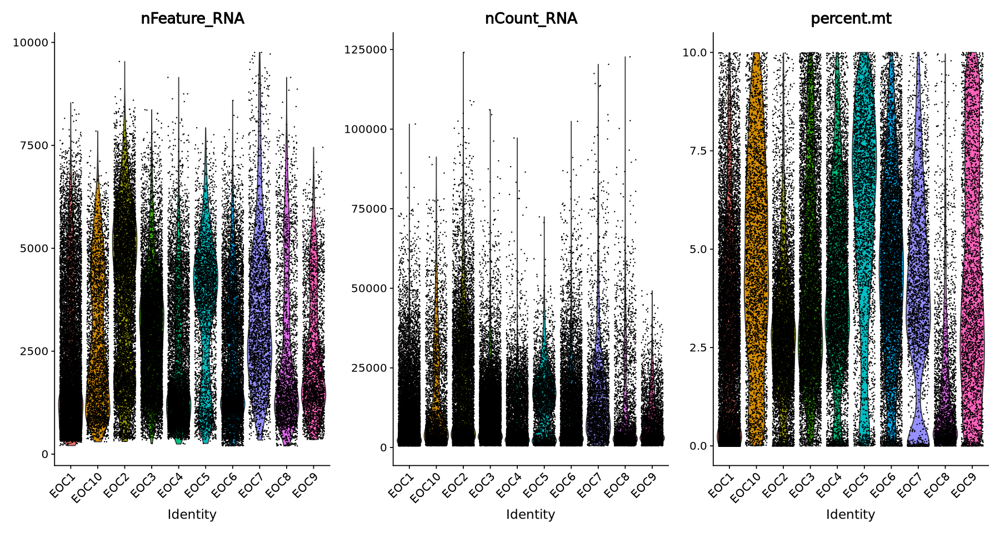

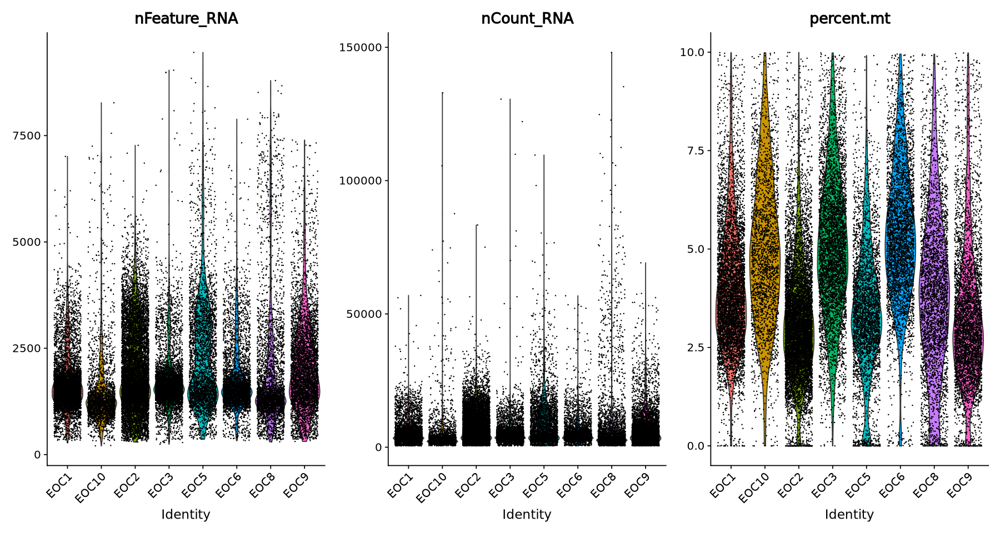

In [28]:
#QC Steps - tumour
HGSOC_tumour[["percent.mt"]] <- PercentageFeatureSet(HGSOC_tumour, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(HGSOC_tumour, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

#QC Steps - ascites
HGSOC_ascites[["percent.mt"]] <- PercentageFeatureSet(HGSOC_ascites, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(HGSOC_ascites, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

In [29]:
#Normalise the data - tumour 
HGSOC_tumour <- NormalizeData(HGSOC_tumour)
#Find variable features
HGSOC_tumour <- FindVariableFeatures(HGSOC_tumour, selection.method = "vst", nfeatures = 2000)
#Scale the data
HGSOC_tumour <- ScaleData(HGSOC_tumour, vars.to.regress = c("percent.mt", "nCount_RNA"))
#Run pca
HGSOC_tumour <- RunPCA(HGSOC_tumour, features = VariableFeatures(object = HGSOC_tumour))

#Normalise the data - ascites 
HGSOC_ascites <- NormalizeData(HGSOC_ascites)
#Find variable features
HGSOC_ascites <- FindVariableFeatures(HGSOC_ascites, selection.method = "vst", nfeatures = 2000)
#Scale the data
HGSOC_ascites <- ScaleData(HGSOC_ascites, vars.to.regress = c("percent.mt", "nCount_RNA"))
#Run pca
HGSOC_ascites <- RunPCA(HGSOC_ascites, features = VariableFeatures(object = HGSOC_ascites))

Normalizing layer: counts



Finding variable features for layer counts

Regressing out percent.mt, nCount_RNA

Centering and scaling data matrix

PC_ 1 
Positive:  COL6A2, SPARC, COL1A2, COL1A1, COL5A2, COL3A1, BGN, AEBP1, PCOLCE, COL6A1 
	   COL6A3, CALD1, THY1, DCN, LUM, COL5A1, SERPINH1, CTHRC1, THBS2, IGFBP7 
	   CTSK, FSTL1, PRRX1, MXRA8, PTRF, IGFBP4, FAP, RCN3, ANTXR1, MMP11 
Negative:  HLA-DRA, HLA-DPB1, HLA-DRB5, TYROBP, HLA-DQB1, FCER1G, HLA-DQA1, AIF1, RGS1, C1QA 
	   CCL4, C1QC, MS4A7, PLEK, SPI1, BCL2A1, C1QB, CCL3, CYBB, SERPINA1 
	   CD14, IL1B, MS4A6A, CD68, C1orf162, FCGR3A, GPR183, C15orf48, APOC1, FCGR2A 
PC_ 2 
Positive:  CD68, C1QC, TYROBP, FCER1G, C1QA, AIF1, C1QB, PLAUR, MS4A7, CD14 
	   APOE, SPI1, TMEM176B, CCL3, PLEK, CYBB, FCGR2A, APOC1, IL1B, CTSL 
	   MS4A6A, FCGR3A, CSF1R, BCL2A1, CD163, FTL, CD83, CTSS, TREM2, CCL3L3 
Negative:  WFDC2, KRT7, KRT19, SLPI, CD24, FOLR1, TM4SF1, MAL2, CLU, S100A14 
	   MUC16, MUC1, CP, LCN2, SNCG, KLK7, S100A1, SLC34A2, CXADR, PDZK1IP1 
	   RPS10, SCGB2

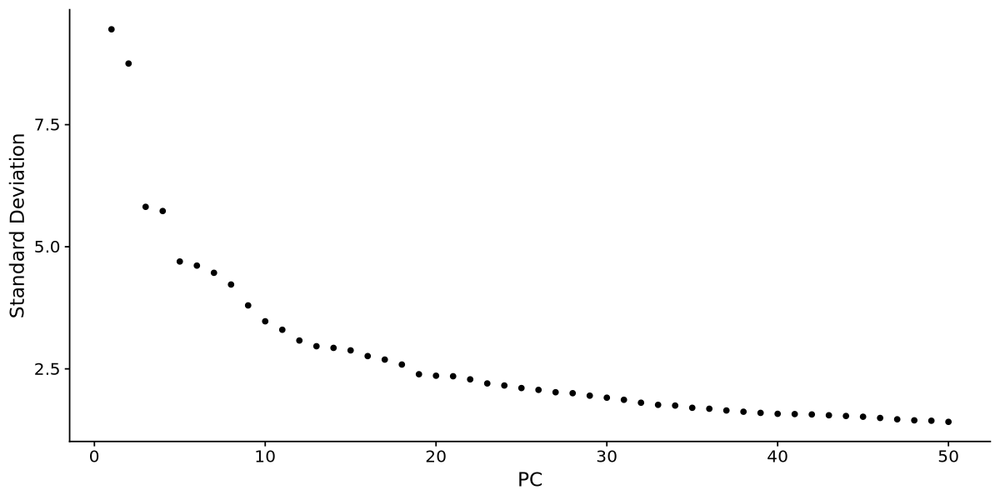

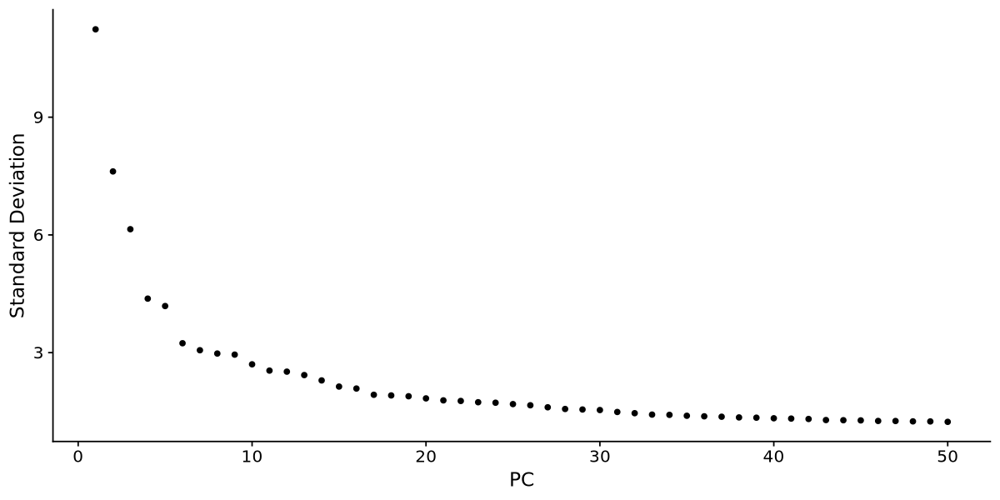

In [30]:
#make elbow plot - tumour
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(HGSOC_tumour, ndims=50)
#in GSE213243 decided to use 40 PC, staying consistent across datasets

#make elbow plot - ascites
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(HGSOC_ascites, ndims=50)
#in GSE213243 decided to use 40 PC, staying consistent across datasets

In [31]:
#Find neighbours (make sure number matches no. features chosen above)
HGSOC_tumour <- FindNeighbors(HGSOC_tumour, dims = 1:40)

#Find neighbours (make sure number matches no. features chosen above)
HGSOC_ascites <- FindNeighbors(HGSOC_ascites, dims = 1:40)

Computing nearest neighbor graph

Computing SNN

Computing nearest neighbor graph

Computing SNN



In [32]:
#Run UMAP
HGSOC_tumour <- RunUMAP(HGSOC_tumour, dims = 1:40)

HGSOC_ascites <- RunUMAP(HGSOC_ascites, dims = 1:40)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


16:58:13 UMAP embedding parameters a = 0.9922 b = 1.112

16:58:13 Read 66707 rows and found 40 numeric columns

16:58:13 Using Annoy for neighbor search, n_neighbors = 30

16:58:13 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:58:19 Writing NN index file to temp file /scratch/temp/9859864/Rtmp2rXZYp/file315f905091dd9b

16:58:19 Searching Annoy index using 1 thread, search_k = 3000

16:58:39 Annoy recall = 100%

16:58:40 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:58:42 Initializing from normalized Laplacian + noise (using RSpectra)

16:58:49 Commencing optimization for 200 epochs, with 2955448 positive edges

16:59:18 Optimization finished

16:59:18 UMAP embedding parameters a = 0.9922 b = 1.112

16:59:18 Read 38206 

In [33]:
#Cluster, resolution here set to 0.2
HGSOC_tumour <- FindClusters(HGSOC_tumour, resolution = 0.2)
HGSOC_ascites <- FindClusters(HGSOC_ascites, resolution = 0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 66707
Number of edges: 2479178

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9761
Number of communities: 20
Elapsed time: 16 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 38206
Number of edges: 1405041

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9461
Number of communities: 14
Elapsed time: 8 seconds


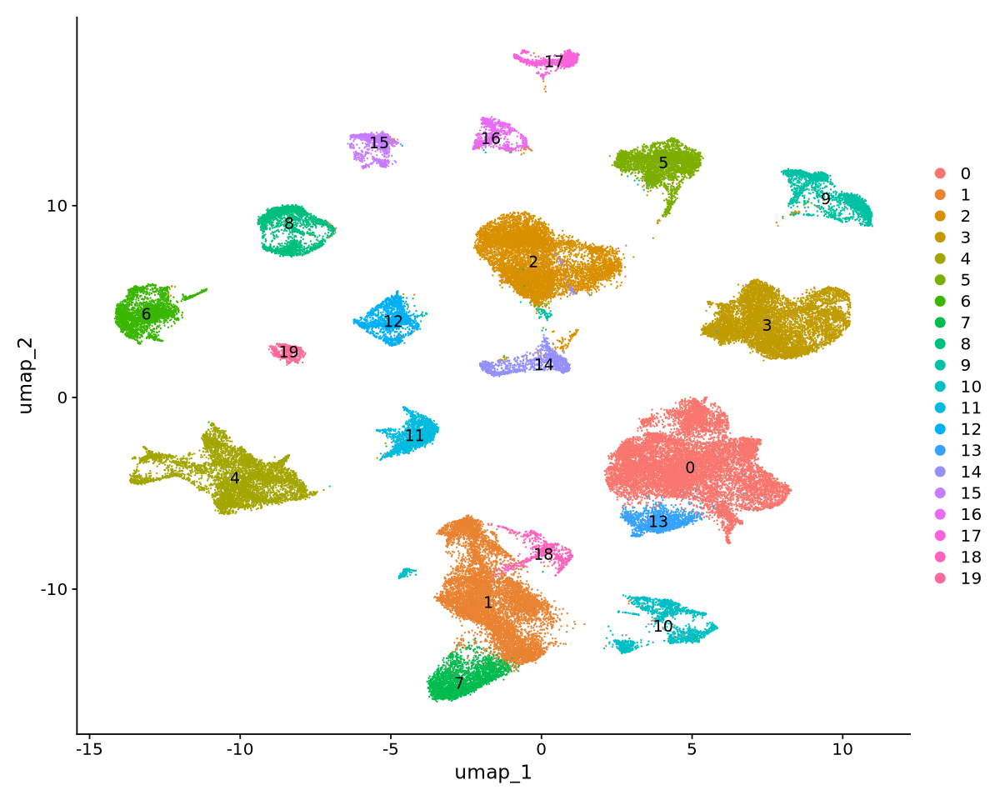

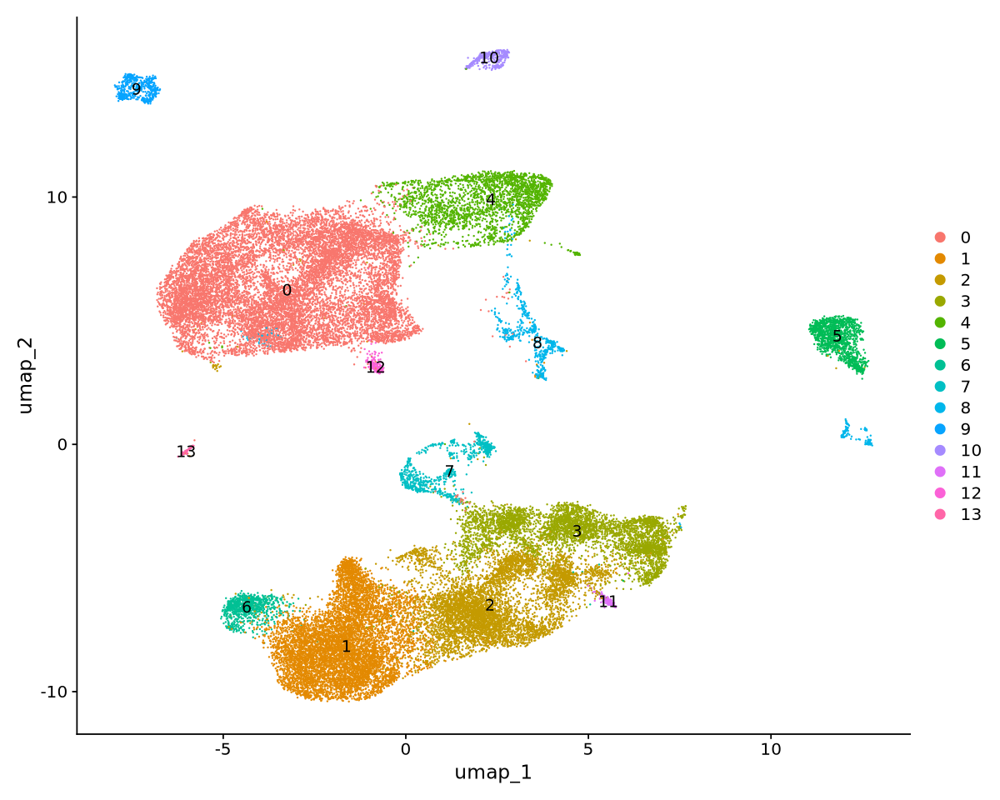

In [34]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(HGSOC_tumour, reduction = "umap", label=TRUE)
DimPlot(HGSOC_ascites, reduction = "umap", label=TRUE)

In [35]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(HGSOC_tumour, file = "/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_tumour_ongoing2.RDS")
saveRDS(HGSOC_ascites, file = "/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_ascites_ongoing2.RDS")

In [3]:
#Load in downloaded RDS
#HGSOC_ascites <- readRDS("/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_ascites_ongoing2.RDS")
#HGSOC_tumour <- readRDS("/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_tumour_ongoing2.RDS")

In [36]:
HGSOC_ascites
HGSOC_tumour

An object of class Seurat 
27127 features across 38206 samples within 1 assay 
Active assay: RNA (27127 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
27127 features across 66707 samples within 1 assay 
Active assay: RNA (27127 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

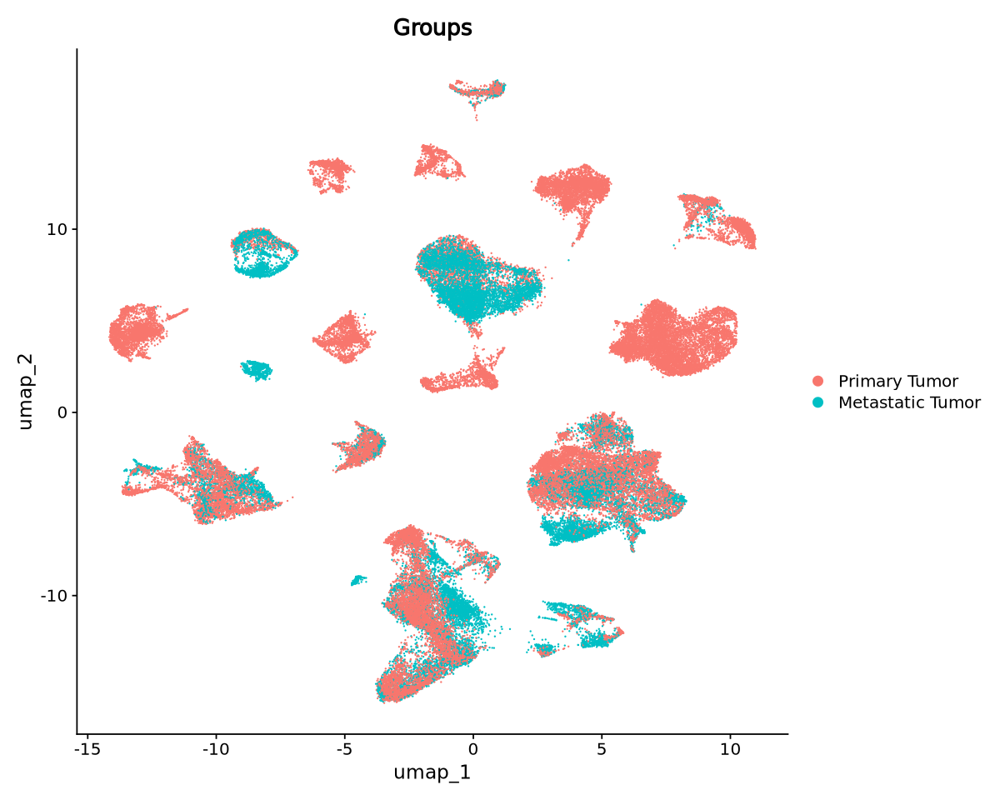

In [37]:
#Plot UMAP - checking primary tumour and mets look similar on dim reduction
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(HGSOC_tumour, group.by = 'Groups', reduction = "umap")

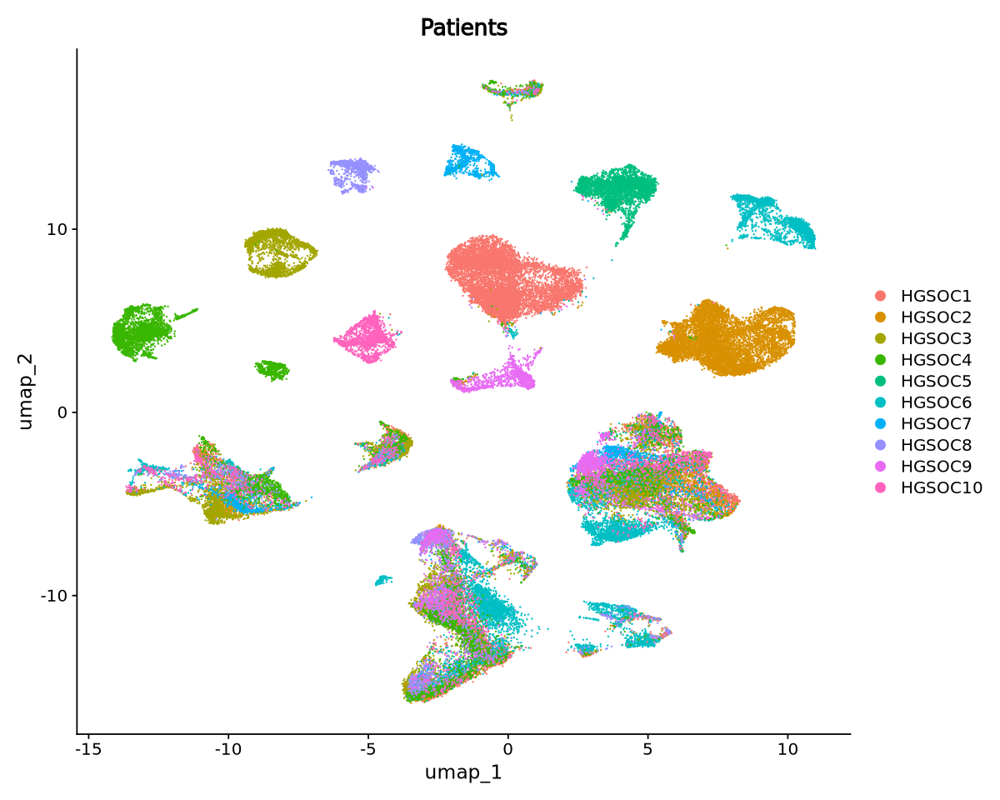

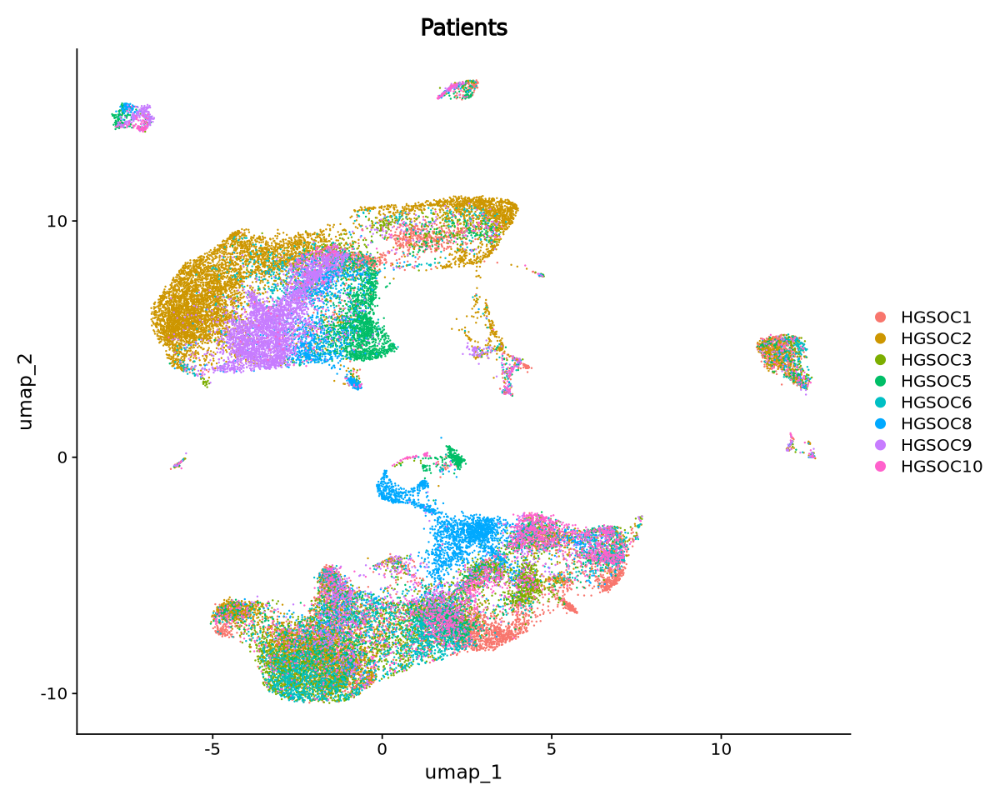

In [38]:
#Plot UMAP - see how different patients overlay
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(HGSOC_tumour, group.by = 'Patients', reduction = "umap")
DimPlot(HGSOC_ascites, group.by = 'Patients', reduction = "umap")

#### Next part of code is about determining which cluster is the myeloid cells

##### First with tumour

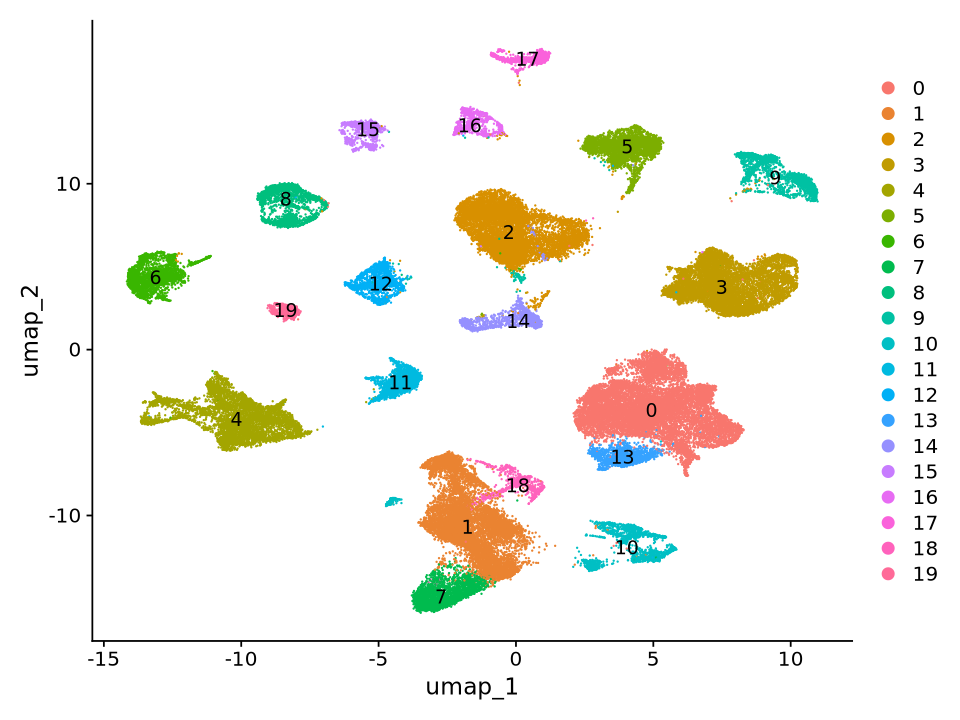

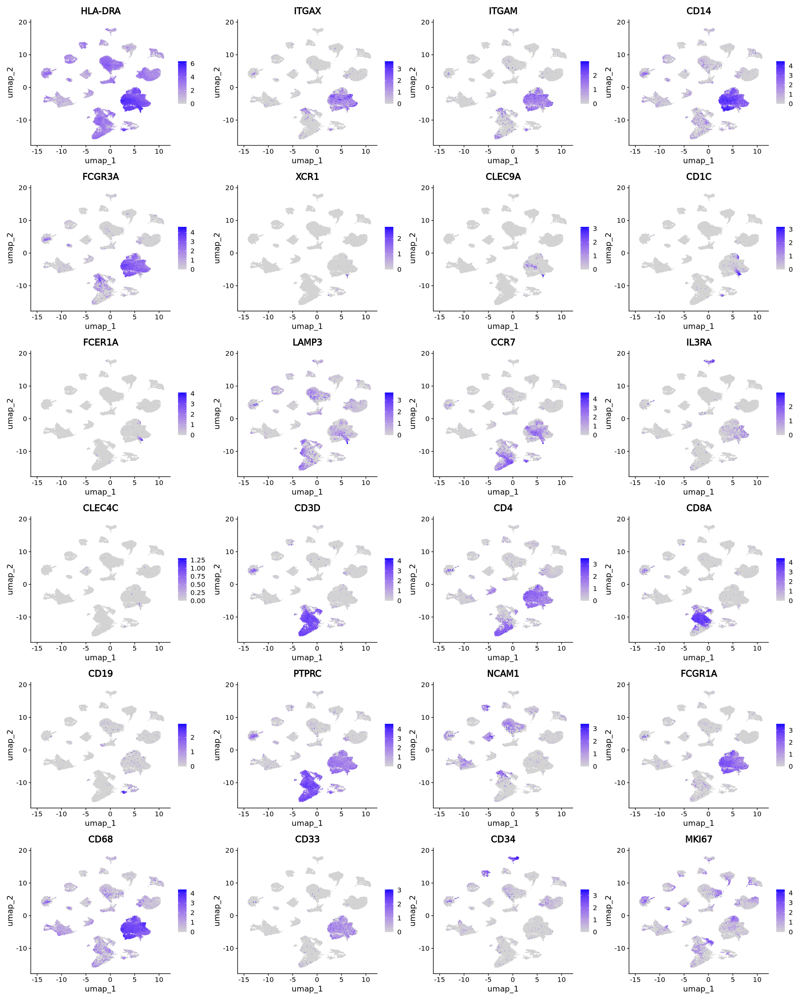

In [39]:
#Canonical genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(HGSOC_tumour, reduction = "umap", label=TRUE)

options(repr.plot.height=25, repr.plot.width=20)
FeaturePlot(HGSOC_tumour, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67"), order = TRUE)

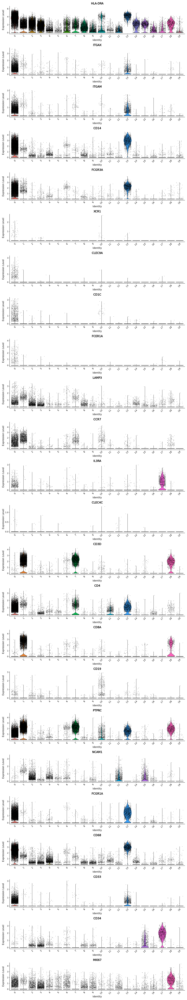

In [8]:
#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(HGSOC_tumour, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67"), ncol=1)

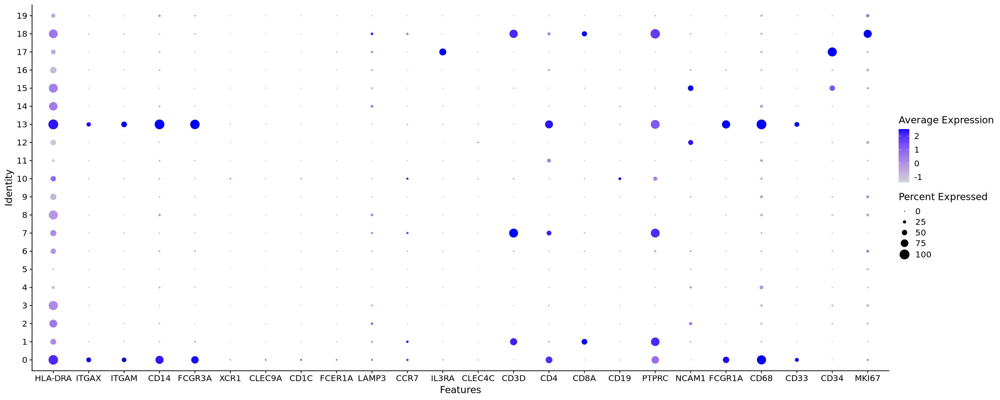

In [40]:
#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(HGSOC_tumour, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67"))

In [10]:
#For interests sake, plot my sig over full UMAP (this will be done again on myeloid sub-clustering)

#make an object with my top 100 DEGs (ag_pos vs Dll1 limma)
sig <- list(c(
  'CCL22',
  'IL4I1',
  'SIRPA',
  'CCR7',
  'CHST11',
  'GPR157',
  'RGS1',
  'BIRC3',
  'TRAF1',
  'CSF2RA',
  'TBC1D13',
  'LAMP3',
  'MREG',
  'PPP1R14A',
  'SPRED2',
  'CD83',
  'TXN',
  'MOB3A',
  'NFKB1',
  'TBC1D4',
  'CDK2',
  'WFDC21P',
  'ARAP2',
  'ZER1',
  'ACSL1',
  'SPINT2',
  'SQSTM1',
  'TBC1D8',
  'JAG1',
  'AC073508.3',
  'BATF',
  'ETV3',
  'BCL2',
  'KIF2A',
  'FSCN1',
  'TNFAIP3',
  'CCDC28B',
  'NR4A3',
  'CYTIP',
  'PLEK',
  'FOXO1',
  'TOMM34',
  'TRAFD1',
  'PPP1R16B',
  'CXCR4',
  'CD40',
  'ENTPD7',
  'CDKN1A',
  'BID',
  'MARCKS',
  'DUSP5',
  'MAP4K4',
  'BCL2L1',
  'ISG20',
  'RNF145',
  'RNF121',
  'GPR132',
  'RASGEF1B',
  'CYRIA',
  'RAB10',
  'CERS6',
  'IL1R1',
  'STK4',
  'CLEC2D',
  'AL390719.1',
  'ZBTB38',
  'IFNGR2',
  'CD274',
  'SLC41A2',
  'NRP2',
  'ANKRD33B',
  'GPR183',
  'POGLUT1',
  'ADORA2A',
  'JADE3',
  'KHDRBS3',
  'CTNNB1',
  'SLCO5A1',
  'NFKB2',
  'RGS2',
  'SEC61B',
  'ZNRF1',
  'RELB',
  'C12orf45',
  'IRF2',
  'EPOP',
  'MXD1',
  'RAB5B',
  'PADI2',
  'DRAM1',
  'MTMR4',
  'EEF2K',
  'GCNT2',
  'RAPH1',
  'BCL2A1',
  'SEC23B',
  'PIM3',
  'ANTXR2',
  'ABTB2',
  'TMEM200A'
))

In [11]:
#calculate module score
HGSOC_tumour_mod <- AddModuleScore(
  object = HGSOC_tumour,
  features = sig,
  name = "Sig_enriched"
)

Warning message:
“The following features are not present in the object: WFDC21P, AC073508.3, CYRIA, AL390719.1, EPOP, not searching for symbol synonyms”


In [12]:
head(HGSOC_tumour_mod@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,⋯,G2M.Score,Annotation,Group_abb,maintypes_2,maintypes_3,UMAP_1,UMAP_2,RNA_snn_res.0.2,seurat_clusters,Sig_enriched1
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<chr>,<fct>,<fct>,<chr>,<dbl>,<dbl>,<fct>,<fct>,<dbl>
PRJCA005422_EOC1_OC_cell_AAACCTGAGATGCGAC,EOC1,567,286,EOC1_OC_cell_AAACCTGAGATGCGAC,HGSOC1_PT,Primary Tumor,HGSOC1,7.2310406,20.105820,0.7054674,⋯,-0.06007208,Proliferative cells,PT,Proliferative cells,Proliferative cells,-4.50855920,6.7797562,10,10,0.02329823
PRJCA005422_EOC1_OC_cell_AAACCTGCAGCTGCAC,EOC1,30187,1427,EOC1_OC_cell_AAACCTGCAGCTGCAC,HGSOC1_PT,Primary Tumor,HGSOC1,0.5631563,2.166496,0.1026932,⋯,-0.03251072,B03_PlasmaB-SDC1,PT,B,Lymphoid cells,-0.62123874,12.6910764,10,10,0.06689525
PRJCA005422_EOC1_OC_cell_AAACCTGGTGATAAAC,EOC1,9983,3032,EOC1_OC_cell_AAACCTGGTGATAAAC,HGSOC1_PT,Primary Tumor,HGSOC1,4.1670840,23.024537,0.3805709,⋯,0.07461391,Proliferative cells,PT,Proliferative cells,Proliferative cells,1.22135309,2.6347593,18,18,-0.02517885
PRJCA005422_EOC1_OC_cell_AAAGATGAGCTAAACA,EOC1,4431,1810,EOC1_OC_cell_AAAGATGAGCTAAACA,HGSOC1_PT,Primary Tumor,HGSOC1,2.7081923,15.907040,0.9702166,⋯,-0.03833690,T03_CD4-FOXP3,PT,CD4+ T,Lymphoid cells,0.01758646,4.1884056,7,7,0.20601547
PRJCA005422_EOC1_OC_cell_AAAGTAGAGCGTCTAT,EOC1,1010,634,EOC1_OC_cell_AAAGTAGAGCGTCTAT,HGSOC1_PT,Primary Tumor,HGSOC1,3.9603960,12.957468,0.3956479,⋯,0.02303774,T08_CD8-GZMK,PT,CD8+ T,Lymphoid cells,-4.61451527,2.3624628,1,1,0.01817031
PRJCA005422_EOC1_OC_cell_AAAGTAGAGGCATGGT,EOC1,3198,1313,EOC1_OC_cell_AAAGTAGAGGCATGGT,HGSOC1_PT,Primary Tumor,HGSOC1,2.0637899,18.667917,0.3752345,⋯,0.05512859,T08_CD8-GZMK,PT,CD8+ T,Lymphoid cells,-3.89796826,-0.1594356,1,1,0.03636697


In [13]:
library(ggplot2)
library(RColorBrewer)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


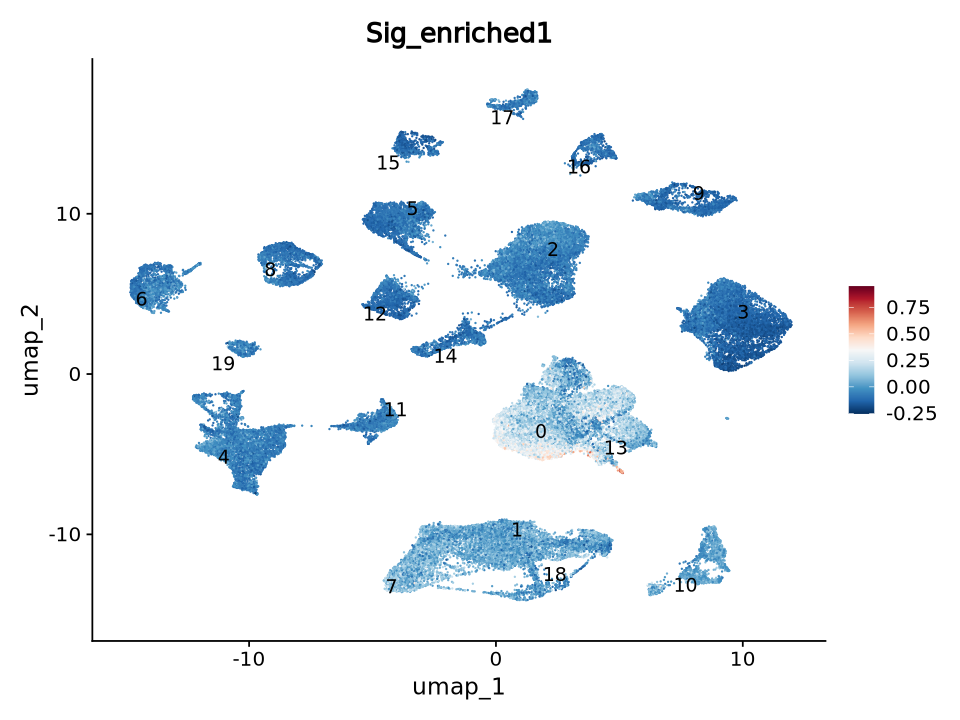

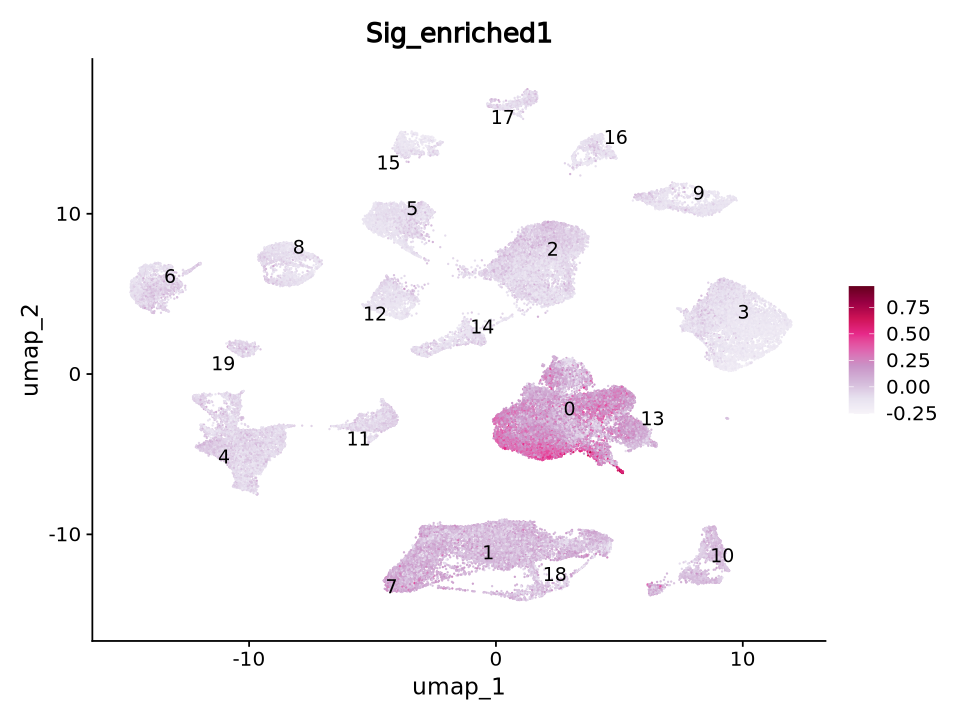

In [14]:
#Plot UMAP with module score
options(repr.plot.height=6, repr.plot.width=8)

FeaturePlot(HGSOC_tumour_mod,
            features = "Sig_enriched1", label = TRUE, repel = TRUE) +
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

FeaturePlot(HGSOC_tumour_mod,
            features = "Sig_enriched1", label = TRUE, repel = TRUE) +
            scale_colour_gradientn(colours = brewer.pal(n = 9, name = "PuRd"))

#### From above it looks like both cluster 0 and 13 from tumour is the myeloid cells, now subsetting out cluster 0 and 13

In [41]:
head(HGSOC_tumour@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,⋯,maintypes_2,maintypes_3,UMAP_1,UMAP_2,sample_type,cancer_type,patient_id,sample_id,RNA_snn_res.0.2,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<fct>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>,<fct>,<fct>
PRJCA005422_EOC1_OC_cell_AAACCTGAGATGCGAC,EOC1,567,286,EOC1_OC_cell_AAACCTGAGATGCGAC,HGSOC1_PT,Primary Tumor,HGSOC1,7.2310406,20.105820,0.7054674,⋯,Proliferative cells,Proliferative cells,-4.50855920,6.7797562,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT,10,10
PRJCA005422_EOC1_OC_cell_AAACCTGCAGCTGCAC,EOC1,30187,1427,EOC1_OC_cell_AAACCTGCAGCTGCAC,HGSOC1_PT,Primary Tumor,HGSOC1,0.5631563,2.166496,0.1026932,⋯,B,Lymphoid cells,-0.62123874,12.6910764,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT,10,10
PRJCA005422_EOC1_OC_cell_AAACCTGGTGATAAAC,EOC1,9983,3032,EOC1_OC_cell_AAACCTGGTGATAAAC,HGSOC1_PT,Primary Tumor,HGSOC1,4.1670840,23.024537,0.3805709,⋯,Proliferative cells,Proliferative cells,1.22135309,2.6347593,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT,18,18
PRJCA005422_EOC1_OC_cell_AAAGATGAGCTAAACA,EOC1,4431,1810,EOC1_OC_cell_AAAGATGAGCTAAACA,HGSOC1_PT,Primary Tumor,HGSOC1,2.7081923,15.907040,0.9702166,⋯,CD4+ T,Lymphoid cells,0.01758646,4.1884056,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT,7,7
PRJCA005422_EOC1_OC_cell_AAAGTAGAGCGTCTAT,EOC1,1010,634,EOC1_OC_cell_AAAGTAGAGCGTCTAT,HGSOC1_PT,Primary Tumor,HGSOC1,3.9603960,12.957468,0.3956479,⋯,CD8+ T,Lymphoid cells,-4.61451527,2.3624628,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT,1,1
PRJCA005422_EOC1_OC_cell_AAAGTAGAGGCATGGT,EOC1,3198,1313,EOC1_OC_cell_AAAGTAGAGGCATGGT,HGSOC1_PT,Primary Tumor,HGSOC1,2.0637899,18.667917,0.3752345,⋯,CD8+ T,Lymphoid cells,-3.89796826,-0.1594356,Primary Tumor,HGSOC,HGSOC1,PRJCA005422_HGSOC1_PT,1,1


In [42]:
myeloid_HGSOC_tumour <- subset(HGSOC_tumour, subset = RNA_snn_res.0.2 %in% c("0","13"))

In [43]:
table(HGSOC_tumour$RNA_snn_res.0.2)
table(myeloid_HGSOC_tumour$RNA_snn_res.0.2)


    0     1     2     3     4     5     6     7     8     9    10    11    12 
11902  8673  8018  7657  5422  3274  2791  2737  2238  2106  1769  1668  1664 
   13    14    15    16    17    18    19 
 1354  1293  1086   944   863   702   546 


    0     1     2     3     4     5     6     7     8     9    10    11    12 
11902     0     0     0     0     0     0     0     0     0     0     0     0 
   13    14    15    16    17    18    19 
 1354     0     0     0     0     0     0 

In [44]:
myeloid_HGSOC_tumour

An object of class Seurat 
27127 features across 13256 samples within 1 assay 
Active assay: RNA (27127 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

In [45]:
saveRDS(myeloid_HGSOC_tumour, "/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_tumour_myeloid.RDS")

##### Now repeating the above for the ascites

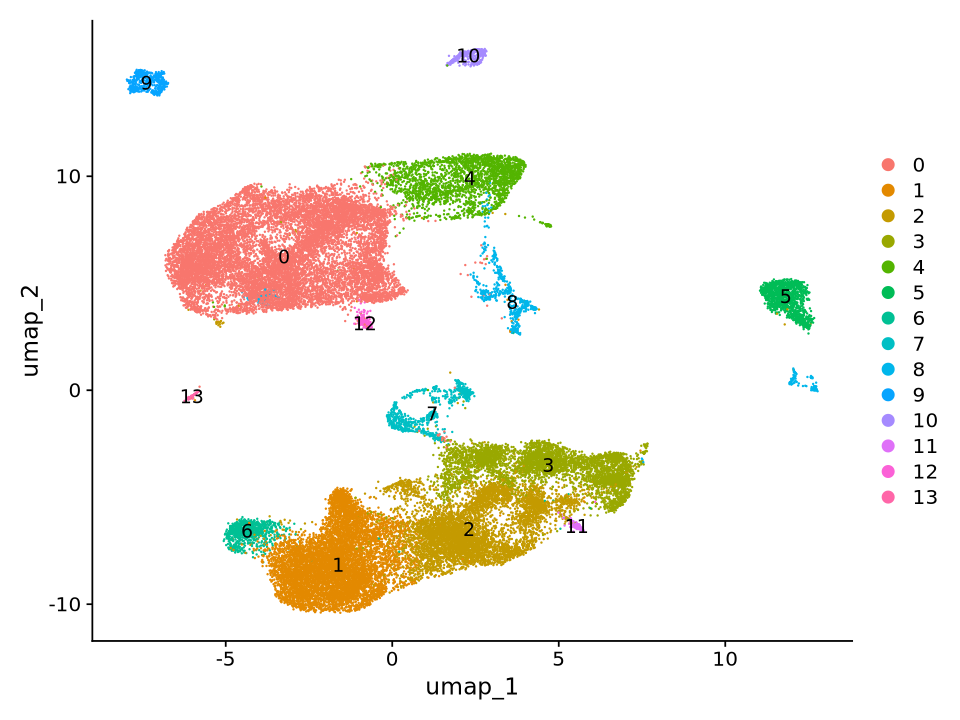

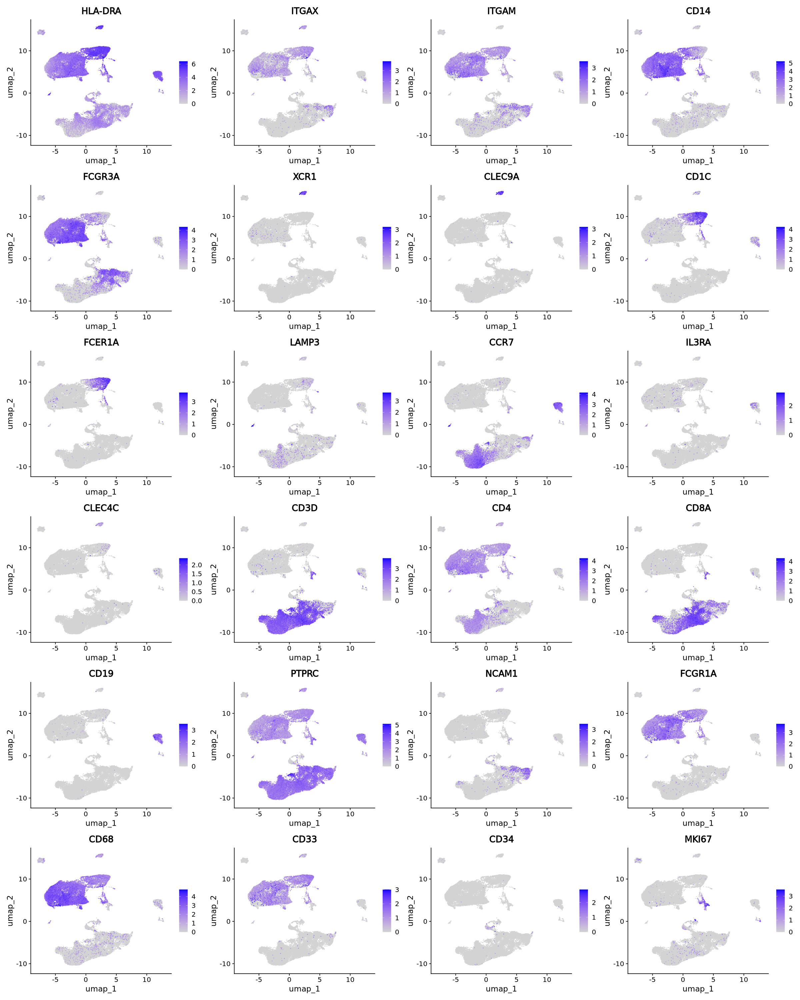

In [7]:
#Canonical genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(HGSOC_ascites, reduction = "umap", label=TRUE)

options(repr.plot.height=25, repr.plot.width=20)
FeaturePlot(HGSOC_ascites, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67"), order = TRUE)

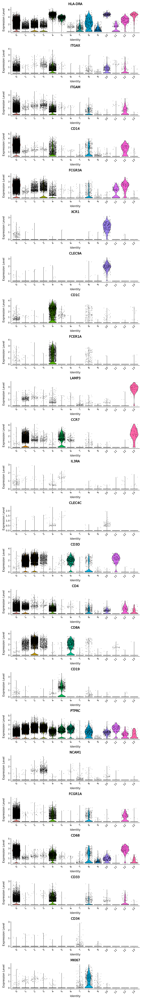

In [19]:
#Violin plots of classic markers
options(repr.plot.height=70, repr.plot.width=10)
VlnPlot(HGSOC_ascites, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67"), ncol=1)

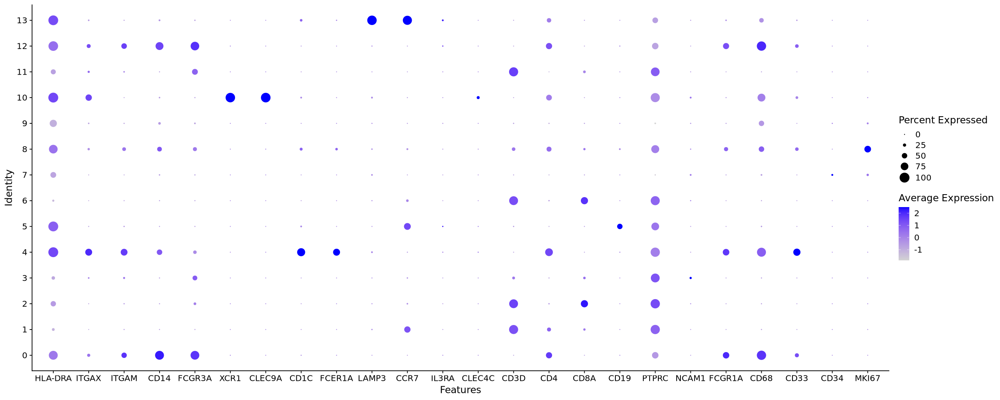

In [46]:
#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(HGSOC_ascites, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67"))

In [10]:
#For interests sake, plot my sig over full UMAP (this will be done again on myeloid sub-clustering)

#make an object with my top 100 DEGs (ag_pos vs Dll1 limma)
sig <- list(c(
  'CCL22',
  'IL4I1',
  'SIRPA',
  'CCR7',
  'CHST11',
  'GPR157',
  'RGS1',
  'BIRC3',
  'TRAF1',
  'CSF2RA',
  'TBC1D13',
  'LAMP3',
  'MREG',
  'PPP1R14A',
  'SPRED2',
  'CD83',
  'TXN',
  'MOB3A',
  'NFKB1',
  'TBC1D4',
  'CDK2',
  'WFDC21P',
  'ARAP2',
  'ZER1',
  'ACSL1',
  'SPINT2',
  'SQSTM1',
  'TBC1D8',
  'JAG1',
  'AC073508.3',
  'BATF',
  'ETV3',
  'BCL2',
  'KIF2A',
  'FSCN1',
  'TNFAIP3',
  'CCDC28B',
  'NR4A3',
  'CYTIP',
  'PLEK',
  'FOXO1',
  'TOMM34',
  'TRAFD1',
  'PPP1R16B',
  'CXCR4',
  'CD40',
  'ENTPD7',
  'CDKN1A',
  'BID',
  'MARCKS',
  'DUSP5',
  'MAP4K4',
  'BCL2L1',
  'ISG20',
  'RNF145',
  'RNF121',
  'GPR132',
  'RASGEF1B',
  'CYRIA',
  'RAB10',
  'CERS6',
  'IL1R1',
  'STK4',
  'CLEC2D',
  'AL390719.1',
  'ZBTB38',
  'IFNGR2',
  'CD274',
  'SLC41A2',
  'NRP2',
  'ANKRD33B',
  'GPR183',
  'POGLUT1',
  'ADORA2A',
  'JADE3',
  'KHDRBS3',
  'CTNNB1',
  'SLCO5A1',
  'NFKB2',
  'RGS2',
  'SEC61B',
  'ZNRF1',
  'RELB',
  'C12orf45',
  'IRF2',
  'EPOP',
  'MXD1',
  'RAB5B',
  'PADI2',
  'DRAM1',
  'MTMR4',
  'EEF2K',
  'GCNT2',
  'RAPH1',
  'BCL2A1',
  'SEC23B',
  'PIM3',
  'ANTXR2',
  'ABTB2',
  'TMEM200A'
))

In [12]:
#calculate module score
HGSOC_ascites_mod <- AddModuleScore(
  object = HGSOC_ascites,
  features = sig,
  name = "Sig_enriched"
)

Warning message:
“The following features are not present in the object: WFDC21P, AC073508.3, CYRIA, AL390719.1, EPOP, not searching for symbol synonyms”


In [14]:
library(ggplot2)
library(RColorBrewer)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


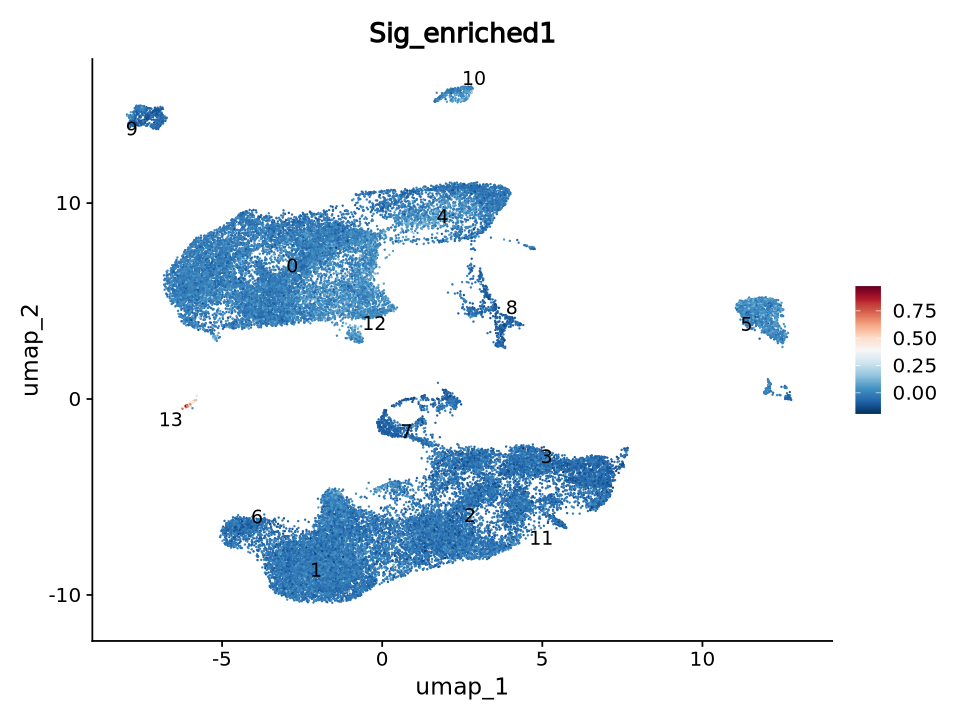

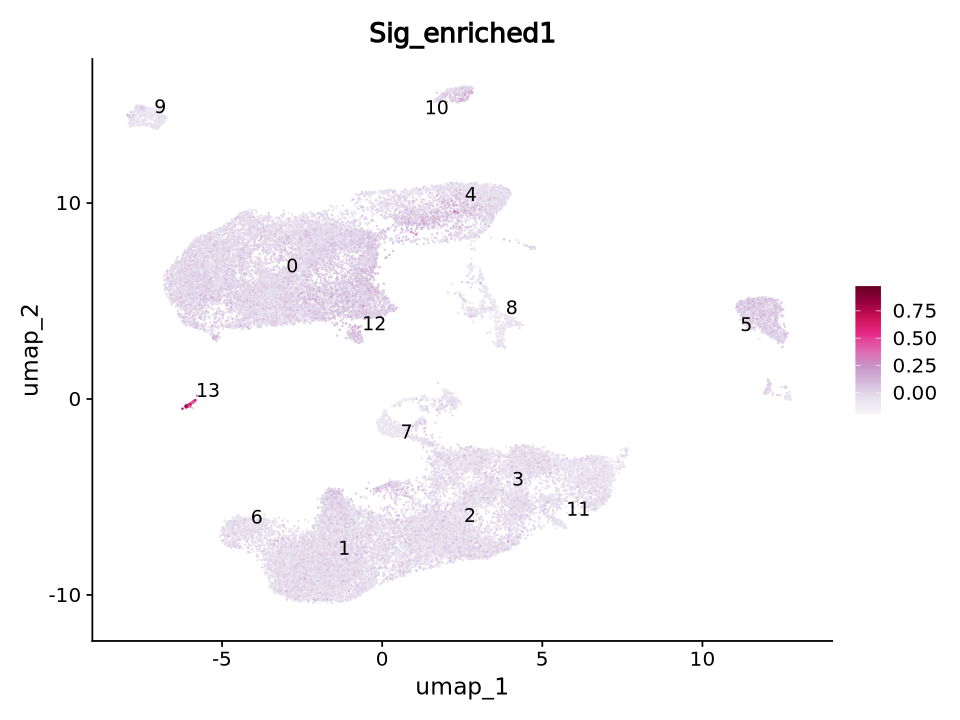

In [15]:
#Plot UMAP with module score
options(repr.plot.height=6, repr.plot.width=8)

FeaturePlot(HGSOC_ascites_mod,
            features = "Sig_enriched1", label = TRUE, repel = TRUE) +
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

FeaturePlot(HGSOC_ascites_mod,
            features = "Sig_enriched1", label = TRUE, repel = TRUE) +
            scale_colour_gradientn(colours = brewer.pal(n = 9, name = "PuRd"))

#### From above it looks like clusters 0, 4, 8, 10, 12, 13 from ascites are the myeloid cells, now subsetting out these clusters

In [47]:
head(HGSOC_ascites@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cellname,Samples,Groups,Patients,percent.mt,percent.ribo,percent.HSP,⋯,maintypes_2,maintypes_3,UMAP_1,UMAP_2,sample_type,cancer_type,patient_id,sample_id,RNA_snn_res.0.2,seurat_clusters
,<fct>,<dbl>,<int>,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,⋯,<fct>,<chr>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>,<fct>,<fct>
PRJCA005422_EOC1_FS_cell_AAACCTGAGATCCCGC,EOC1,10454,2694,EOC1_FS_cell_AAACCTGAGATCCCGC,HGSOC1_AS,Ascites,HGSOC1,4.161087,35.24010,0.2678401,⋯,CD8+ T,Lymphoid cells,-4.01762578,1.6216145,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS,1,1
PRJCA005422_EOC1_FS_cell_AAACCTGAGCGATCCC,EOC1,3165,1251,EOC1_FS_cell_AAACCTGAGCGATCCC,HGSOC1_AS,Ascites,HGSOC1,4.518167,31.08023,0.6001263,⋯,CD8+ T,Lymphoid cells,-4.58068654,3.0822748,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS,2,2
PRJCA005422_EOC1_FS_cell_AAACCTGAGGATGTAT,EOC1,3229,1169,EOC1_FS_cell_AAACCTGAGGATGTAT,HGSOC1_AS,Ascites,HGSOC1,6.782286,33.47786,0.2167854,⋯,B,Lymphoid cells,-7.13849637,12.1479865,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS,5,5
PRJCA005422_EOC1_FS_cell_AAACCTGAGTGGAGAA,EOC1,5372,1698,EOC1_FS_cell_AAACCTGAGTGGAGAA,HGSOC1_AS,Ascites,HGSOC1,3.611318,36.95086,0.4839911,⋯,CD4+ T,Lymphoid cells,-5.04447552,5.0159007,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS,1,1
PRJCA005422_EOC1_FS_cell_AAACCTGCAACGCACC,EOC1,5148,1913,EOC1_FS_cell_AAACCTGCAACGCACC,HGSOC1_AS,Ascites,HGSOC1,2.933178,24.43667,0.3302253,⋯,CD4+ T,Lymphoid cells,-1.11060306,4.6272436,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS,1,1
PRJCA005422_EOC1_FS_cell_AAACCTGCATTACCTT,EOC1,3041,1476,EOC1_FS_cell_AAACCTGCATTACCTT,HGSOC1_AS,Ascites,HGSOC1,6.215061,16.96810,0.3288392,⋯,NK,Lymphoid cells,0.08312429,0.1599053,Ascites,HGSOC,HGSOC1,PRJCA005422_HGSOC1_AS,3,3


In [48]:
myeloid_HGSOC_ascites <- subset(HGSOC_ascites, subset = RNA_snn_res.0.2 %in% c("0","4","8","10","12","13"))

In [49]:
table(HGSOC_ascites$RNA_snn_res.0.2)
table(myeloid_HGSOC_ascites$RNA_snn_res.0.2)


    0     1     2     3     4     5     6     7     8     9    10    11    12 
12324  7819  6158  4319  2466  1305   933   842   702   502   369   208   176 
   13 
   83 


    0     1     2     3     4     5     6     7     8     9    10    11    12 
12324     0     0     0  2466     0     0     0   702     0   369     0   176 
   13 
   83 

In [50]:
myeloid_HGSOC_ascites

An object of class Seurat 
27127 features across 16120 samples within 1 assay 
Active assay: RNA (27127 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap

In [51]:
saveRDS(myeloid_HGSOC_ascites, "/scratch/user/s4436039/scdata/PRJCA005422/PRJCA005422_ascites_myeloid.RDS")

#### Following the above then need to move entire PRJCA005422 folder from scratch to rdm
``` bash
rsync -azvhp /scratch/user/s4436039/scdata/PRJCA005422/ /QRISdata/Q5935/nikita/scdata/PRJCA005422

rsync -azvhp /QRISdata/Q5935/nikita/scdata/PRJCA005422/ /scratch/user/s4436039/scdata/PRJCA005422
```